## Desafio Tecnico:
##### Ozeas Santos - Cientista de Dados / Analista de Dados <br> Tel: 21 96928-5679 - email: ozeassantos@gmail.com <br> Rio de Janeiro RJ
Linkedin: www.linkedin.com/in/ozeassantos

# ====== CARHUB ======

Intro<br>
We want to put a set of data in a standard format.
The data is composed of car maker, car model, car year and car type.
Here is an example:<br><br>
Audi A6 1997 2.8 4p<br>
We have a comprehensive list *A* of car submodels with the names in a standard way. Here is a sample:<br><br>
Audi A6 2015 2.0 Tfsi Ambiente S-tronic 4p<br>
Audi A6 1997 2.8 4p<br>
BMW Serie 3 1995 1.9 3p<br>
BMW Serie 3 1995 1.9 Aut. 3p<br>
BMW Serie 3 1996 1.9 3p<br>
BMW Serie 3 1996 1.9 Aut. 3p<br>
Chevrolet Blazer 1996 2.2 Std 5p<br>
Chevrolet Blazer 1996 2.5 Dlx Turbo 5p<br><br>
We have a list *B* of car submodels with the names organised in another way. Here is a sample:<br>
AUDI 80 1982@#1.8<br>
AUDI 80 1983@#1.8<br>
VOLKSWAGEN PASSAT 1990@#SURF 1.8 8V<br>
VOLKSWAGEN PASSAT 1992@#VR6 2.8 12V<br>
VOLKSWAGEN PASSAT 1993@#VR6 2.8 12V<br><br>
(“@#” was added to help to parse or finding the year)<br>
We need to associate each item in the B list to one item in the A list, or vice versa.<br>

In [1]:
import pandas as pd
from unidecode import unidecode

# Importando a base

In [2]:
a_data_list = pd.read_excel('a_list_car_model_standard_meli.xlsx')
b_data_list = pd.read_excel('b_list_cp_application_complete.xlsx', sheet_name= 'Sheet2')

#### Analise Exploratória a_data_list

In [3]:
a_data_list

,maker,model,year,version
0,Acura,Integra,1991,1.8 Gs 2p
1,Acura,Integra,1992,1.8 Gs 2p
2,Acura,Legend,1991,3.2 4p
3,Acura,Legend,1991,3.5 4p
4,Acura,Legend,1992,3.2 4p
...,...,...,...,...
21263,Volvo,XC90,2021,2.0 T8 R-design Recharge (plug-in) 5p Hibrido
21264,Volvo,XC90,2022,2.0 T8 Inscription Expression Recharge (plug-i...
21265,Volvo,XC90,2022,2.0 T8 Inscription Expression Recharge (plug-i...
21266,Volvo,XC90,2022,2.0 T8 Inscription Recharge (plug-in) 5p Hibrido


In [4]:
# A base a_list possui 21268 entradas e 4 colunas ('maker', 'model','year','version').
#Possui 3 colunas do tipo objects (strings ou NaN), e 1 coluna do tipo int64 ('year').

a_data_list.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21268 entries, 0 to 21267
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   maker    21268 non-null  object
 1   model    21268 non-null  object
 2   year     21268 non-null  int64 
 3   version  21261 non-null  object
dtypes: int64(1), object(3)
memory usage: 664.8+ KB


In [5]:
# Estes são os FABRICANTES dos carros
a_data_list['maker'].sort_values().unique()

array(['Acura', 'Agrale', 'Alfa Romeo', 'Am Gen', 'Asia', 'Aston Martin',
       'Audi', 'BMW', 'CBT Jipe', 'Cadillac', 'Chana', 'Changan', 'Chery',
       'Chevrolet', 'Chrysler', 'Citroën', 'Cross Lander', 'Daewoo',
       'Daihatsu', 'Dodge', 'Effa', 'Engesa', 'Envemo', 'Ferrari', 'Fiat',
       'Ford', 'Foton', 'Geely', 'Great Wall', 'Gurgel', 'Hafei', 'Honda',
       'Hummer', 'Hyundai', 'Isuzu', 'Iveco', 'JAC', 'JPX', 'Jaguar',
       'Jeep', 'Jinbei', 'Kia', 'Lada', 'Lamborghini', 'Land Rover',
       'Lexus', 'Lifan', 'Lobini', 'Lotus', 'MG', 'Mahindra', 'Maserati',
       'Matra', 'Mazda', 'Mercedes-Benz', 'Mercury', 'Mini', 'Mitsubishi',
       'Miura', 'Nissan', 'Peugeot', 'Plymouth', 'Pontiac', 'Porsche',
       'RAM', 'Rely', 'Renault', 'Rolls-Royce', 'Rover', 'SEAT', 'Saab',
       'Saturn', 'Shineray', 'Smart', 'Ssangyong', 'Subaru', 'Suzuki',
       'TAC', 'Toyota', 'Troller', 'Volkswagen', 'Volvo'], dtype=object)

In [6]:
# Estes são os MODELOS dos carros
a_data_list['model'].sort_values().unique()

array(['106', '145', '147', '156', '166', '19', '2008', '205', '206',
       '206 CC', '206 SW', '207', '207 Passion', '207 SW', '208', '222',
       '228', '2300', '3000 GT', '3008', '300C', '300M', '306', '307',
       '307 CC', '307 SW', '307 Sedan', '308', '320', '3200 GT',
       '3350Z Coupé', '405', '406', '407', '407 SW', '408', '430',
       '430 ii', '456', '500', '5008', '504 Pick Up', '505', '508', '530',
       '550', '6', '605', '607', '620', '626', '718 boxster',
       '718 cayman', '806', '807', '9000', '911', '911 Targa', 'A1', 'A3',
       'A3 Cabriolet', 'A3 Sedan', 'A3 Sportback', 'A4', 'A4 Avant', 'A5',
       'A5 Cabriolet', 'A5 Sportback', 'A6', 'A6 Allroad', 'A6 Avant',
       'A7', 'A7 Sportback', 'A8', 'A9', 'ASX', 'Accent', 'Accord',
       'Actyon', 'Agile', 'Aircross', 'Airtrek', 'Allroad', 'Altima',
       'Amarok', 'Amigo', 'Applause', 'Argo', 'Arrizo 5', 'Arrizo 6',
       'Astra', 'Astra Sedan', 'Atos', 'Aumark', 'Aventador', 'Azera',
       'B2500', '

In [7]:
# Estes é o ANO de cada modelo

a_data_list['year'].sort_values().unique()

array([1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970,
       1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981,
       1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992,
       1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003,
       2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014,
       2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023], dtype=int64)

In [8]:
# Este é a VERSÃO de cada modelo

a_data_list['version'].value_counts()

2.0 5p                                                                 67
2.0 4p                                                                 46
1.8 4p                                                                 45
1.6 5p                                                                 45
1.8 5p                                                                 39
                                                                       ..
2.0 Freedom S-design 4x4 Aut. 4p 9 marchas                              1
2.0 Freedom S-design 4x4 Aut. 4p 1743 mm                                1
2.0 Freedom 4x4 Aut. 4p marchas                                         1
2.0 Freedom 4x4 Aut. 4p 9 marchas                                       1
2.0 T8 Inscription Expression Recharge (plug-in) 5p Hibrido marchas     1
Name: version, Length: 7171, dtype: int64

In [9]:
# Foi identificado a existência de 7 linhas NaN na coluna 'version'.

print(a_data_list.isna().sum())
a_data_list.loc[a_data_list['version'].isna() == True]

maker      0
model      0
year       0
version    7
dtype: int64


,maker,model,year,version
64,Alfa Romeo,147,2004,NaN
4904,Dodge,Dakota,1997,NaN
10891,Kia,Sportage,2002,NaN
13391,Mitsubishi,Eclipse,1996,NaN
14197,Mitsubishi,Space Wagon,1995,NaN
14199,Mitsubishi,Space Wagon,1999,NaN
14202,Mitsubishi,Space Wagon,2001,NaN


### Tratamento

In [10]:
# Removendo as linhas NaN
a_data_list.dropna(inplace=True)

In [11]:
# Não Foram identificadas linhas duplicadas

duplic_A = a_data_list.drop_duplicates()
print('linhas duplicadas removidas: ',a_data_list.shape[0] - duplic_A.shape[0])
a_data_list = duplic_A

linhas duplicadas removidas:  0


In [12]:
# Para que no futuro fosse possivel a aplicação de métodos de consulta, padronizei as informações em lowcase, e removi suas acentuações.

def remove_accentuation(text):
        """ Metodo remove acentuação """
        return unidecode(str(text))


# Coloca textos em lowcase, e aplica método para remover acentuação
a_data_list['maker'] = a_data_list['maker'].str.lower().apply(remove_accentuation)
a_data_list['model'] = a_data_list['model'].str.lower().apply(remove_accentuation)
a_data_list['version'] = a_data_list['version'].str.lower().apply(remove_accentuation)

a_data_list

,maker,model,year,version
0,acura,integra,1991,1.8 gs 2p
1,acura,integra,1992,1.8 gs 2p
2,acura,legend,1991,3.2 4p
3,acura,legend,1991,3.5 4p
4,acura,legend,1992,3.2 4p
...,...,...,...,...
21263,volvo,xc90,2021,2.0 t8 r-design recharge (plug-in) 5p hibrido
21264,volvo,xc90,2022,2.0 t8 inscription expression recharge (plug-i...
21265,volvo,xc90,2022,2.0 t8 inscription expression recharge (plug-i...
21266,volvo,xc90,2022,2.0 t8 inscription recharge (plug-in) 5p hibrido


## Analise Exploratória b_data_list

In [13]:
b_data_list

,View More HTML,viewmHtml_proc_1,pasted,application_start,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 55,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64
0,<DIV class=cw-main-CwColProductApplcs-content>...,FORD ROYALE 1992@#Todas as versões$FORD ROYALE...,FORD ROYALE 1992@#Todas as versões$FORD ROYALE...,FORD ROYALE 1992@#Todas as versões,FORD ROYALE 1993@#Todas as versões,FORD ROYALE 1994@#Todas as versões,FORD ROYALE 1995@#Todas as versões,FORD ROYALE 1996@#Todas as versões,VOLKSWAGEN QUANTUM 1985@#Todas as versões,VOLKSWAGEN QUANTUM 1986@#Todas as versões,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,<DIV class=cw-main-CwColProductApplcs-content>...,FORD ESCORT 1981@#GUARUJÁ$FORD ESCORT 1982@#GU...,FORD ESCORT 1981@#GUARUJÁ$FORD ESCORT 1982@#GU...,FORD ESCORT 1981@#GUARUJÁ,FORD ESCORT 1982@#GUARUJÁ,FORD ESCORT 1983@#1.8@#BÁSICO@#GHIA@#GL@#GUARU...,FORD ESCORT 1984@#1.8@#BÁSICO@#GHIA@#GL@#GUARU...,FORD ESCORT 1985@#1.8@#BÁSICO@#GHIA@#GL@#GUARU...,FORD ESCORT 1986@#1.8@#BÁSICO@#GHIA@#GL@#GUARU...,FORD ESCORT 1987@#1.8@#BÁSICO@#GHIA@#GL@#GUARU...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,<DIV class=cw-main-CwColProductApplcs-content>...,CITROEN XSARA 1997@#Todas as versões$CITROEN X...,CITROEN XSARA 1997@#Todas as versões$CITROEN X...,CITROEN XSARA 1997@#Todas as versões,CITROEN XSARA 1998@#Todas as versões,CITROEN XSARA 1999@#Todas as versões,CITROEN XSARA 2000@#Todas as versões,CITROEN XSARA 2001@#Todas as versões,CITROEN XSARA 2002@#Todas as versões,CITROEN XSARA 2003@#Todas as versões,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,<DIV class=cw-main-CwColProductApplcs-content>...,AUDI A3 1997@#Todas as versões$AUDI A3 1998@#T...,AUDI A3 1997@#Todas as versões$AUDI A3 1998@#T...,AUDI A3 1997@#Todas as versões,AUDI A3 1998@#Todas as versões,AUDI A3 1999@#Todas as versões,AUDI A3 2000@#Todas as versões,AUDI A3 2001@#Todas as versões,AUDI A3 2002@#Todas as versões,AUDI A3 2003@#Todas as versões,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,<DIV class=cw-main-CwColProductApplcs-content>...,VOLKSWAGEN GOL 2008@#1.6@#GERAÇÃO V 1.0$VOLKSW...,VOLKSWAGEN GOL 2008@#1.6@#GERAÇÃO V 1.0$VOLKSW...,VOLKSWAGEN GOL 2008@#1.6@#GERAÇÃO V 1.0,VOLKSWAGEN GOL 2009@#1.6@#GERAÇÃO V 1.0,VOLKSWAGEN GOL 2010@#1.6@#GERAÇÃO V 1.0,VOLKSWAGEN GOL 2011@#1.6@#GERAÇÃO V 1.0,VOLKSWAGEN GOL 2012@#1.6@#GERAÇÃO V 1.0,VOLKSWAGEN GOL 2013@#1.6@#GERAÇÃO V 1.0,VOLKSWAGEN GOL 2014@#1.6@#GERAÇÃO V 1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200649,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
200650,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
200651,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
200652,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
# A base b_list possui 200654 entradas e 65 colunas ('View More HTML', 'viewmHtml_proc_1','pasted','application_start' e outras 'Unnamed de 4 a 64').
#todas as colunas são do tipo objects (strings ou NaN).
b_data_list.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200654 entries, 0 to 200653
Data columns (total 65 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   View More HTML     86403 non-null  object
 1   viewmHtml_proc_1   86403 non-null  object
 2   pasted             86403 non-null  object
 3   application_start  1560 non-null   object
 4   Unnamed: 4         1544 non-null   object
 5   Unnamed: 5         1528 non-null   object
 6   Unnamed: 6         1493 non-null   object
 7   Unnamed: 7         1482 non-null   object
 8   Unnamed: 8         1469 non-null   object
 9   Unnamed: 9         1420 non-null   object
 10  Unnamed: 10        1364 non-null   object
 11  Unnamed: 11        1276 non-null   object
 12  Unnamed: 12        1197 non-null   object
 13  Unnamed: 13        1114 non-null   object
 14  Unnamed: 14        1033 non-null   object
 15  Unnamed: 15        970 non-null    object
 16  Unnamed: 16        921 non-null    obj

In [15]:
# # Entendendo a estrutura dados: viewmHtml_proc_1 .
b_data_list['viewmHtml_proc_1'][0]

'FORD ROYALE 1992@#Todas as versões$FORD ROYALE 1993@#Todas as versões$FORD ROYALE 1994@#Todas as versões$FORD ROYALE 1995@#Todas as versões$FORD ROYALE 1996@#Todas as versões$VOLKSWAGEN QUANTUM 1985@#Todas as versões$VOLKSWAGEN QUANTUM 1986@#Todas as versões$VOLKSWAGEN QUANTUM 1987@#Todas as versões$VOLKSWAGEN QUANTUM 1988@#Todas as versões$VOLKSWAGEN QUANTUM 1989@#Todas as versões$VOLKSWAGEN QUANTUM 1990@#Todas as versões$VOLKSWAGEN QUANTUM 1991@#Todas as versões$VOLKSWAGEN QUANTUM 1992@#Todas as versões$VOLKSWAGEN QUANTUM 1993@#Todas as versões$VOLKSWAGEN QUANTUM 1994@#Todas as versões$VOLKSWAGEN QUANTUM 1995@#Todas as versões$VOLKSWAGEN QUANTUM 1996@#Todas as versões$VOLKSWAGEN QUANTUM 1997@#Todas as versões$VOLKSWAGEN QUANTUM 1998@#Todas as versões$VOLKSWAGEN QUANTUM 1999@#Todas as versões$VOLKSWAGEN QUANTUM 2000@#Todas as versões$VOLKSWAGEN QUANTUM 2001@#Todas as versões$VOLKSWAGEN QUANTUM 2002@#Todas as versões$VOLKSWAGEN SANTANA 1998@#Todas as versões$VOLKSWAGEN SANTANA 1999@#T

In [16]:
# Entendendo a estrutura dados: 'View More HTML'
b_data_list['View More HTML'][0]

'<DIV class=cw-main-CwColProductApplcs-content>  <DIV>  <P><SPAN><SPAN>FORD ROYALE 1992 </SPAN><SPAN class=sub-item>Todas as versões </SPAN><SPAN>FORD ROYALE 1993 </SPAN><SPAN class=sub-item>Todas as versões </SPAN><SPAN>FORD ROYALE 1994 </SPAN><SPAN class=sub-item>Todas as versões </SPAN><SPAN>FORD ROYALE 1995 </SPAN><SPAN class=sub-item>Todas as versões </SPAN><SPAN>FORD ROYALE 1996 </SPAN><SPAN class=sub-item>Todas as versões </SPAN><SPAN>VOLKSWAGEN QUANTUM 1985 </SPAN><SPAN class=sub-item>Todas as versões </SPAN><SPAN>VOLKSWAGEN QUANTUM 1986 </SPAN><SPAN class=sub-item>Todas as versões </SPAN><SPAN>VOLKSWAGEN QUANTUM 1987 </SPAN><SPAN class=sub-item>Todas as versões </SPAN><SPAN>VOLKSWAGEN QUANTUM 1988 </SPAN><SPAN class=sub-item>Todas as versões </SPAN><SPAN>VOLKSWAGEN QUANTUM 1989 </SPAN><SPAN class=sub-item>Todas as versões </SPAN><SPAN>VOLKSWAGEN QUANTUM 1990 </SPAN><SPAN class=sub-item>Todas as versões </SPAN><SPAN>VOLKSWAGEN QUANTUM 1991 </SPAN><SPAN class=sub-item>Todas as v

In [17]:
# Entendendo a estrutura dados: 'pasted'
b_data_list['pasted'][0]

'FORD ROYALE 1992@#Todas as versões$FORD ROYALE 1993@#Todas as versões$FORD ROYALE 1994@#Todas as versões$FORD ROYALE 1995@#Todas as versões$FORD ROYALE 1996@#Todas as versões$VOLKSWAGEN QUANTUM 1985@#Todas as versões$VOLKSWAGEN QUANTUM 1986@#Todas as versões$VOLKSWAGEN QUANTUM 1987@#Todas as versões$VOLKSWAGEN QUANTUM 1988@#Todas as versões$VOLKSWAGEN QUANTUM 1989@#Todas as versões$VOLKSWAGEN QUANTUM 1990@#Todas as versões$VOLKSWAGEN QUANTUM 1991@#Todas as versões$VOLKSWAGEN QUANTUM 1992@#Todas as versões$VOLKSWAGEN QUANTUM 1993@#Todas as versões$VOLKSWAGEN QUANTUM 1994@#Todas as versões$VOLKSWAGEN QUANTUM 1995@#Todas as versões$VOLKSWAGEN QUANTUM 1996@#Todas as versões$VOLKSWAGEN QUANTUM 1997@#Todas as versões$VOLKSWAGEN QUANTUM 1998@#Todas as versões$VOLKSWAGEN QUANTUM 1999@#Todas as versões$VOLKSWAGEN QUANTUM 2000@#Todas as versões$VOLKSWAGEN QUANTUM 2001@#Todas as versões$VOLKSWAGEN QUANTUM 2002@#Todas as versões$VOLKSWAGEN SANTANA 1998@#Todas as versões$VOLKSWAGEN SANTANA 1999@#T

In [18]:
# Checagem Quantidade de itens NaN:
b_data_list.isna().sum()

View More HTML       114251
viewmHtml_proc_1     114251
pasted               114251
application_start    199094
Unnamed: 4           199110
                      ...  
Unnamed: 60          200641
Unnamed: 61          200646
Unnamed: 62          200648
Unnamed: 63          200650
Unnamed: 64          200653
Length: 65, dtype: int64

# Tratamento b_data_list

In [19]:
# Aplicando função melt, para transformar colunas em linhas.
data = b_data_list.melt(id_vars=None, value_vars=['View More HTML', 'viewmHtml_proc_1', 'pasted', 'application_start',
       'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8',
       'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11', 'Unnamed: 12',
       'Unnamed: 13', 'Unnamed: 14', 'Unnamed: 15', 'Unnamed: 16',
       'Unnamed: 17', 'Unnamed: 18', 'Unnamed: 19', 'Unnamed: 20',
       'Unnamed: 21', 'Unnamed: 22', 'Unnamed: 23', 'Unnamed: 24',
       'Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27', 'Unnamed: 28',
       'Unnamed: 29', 'Unnamed: 30', 'Unnamed: 31', 'Unnamed: 32',
       'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35', 'Unnamed: 36',
       'Unnamed: 37', 'Unnamed: 38', 'Unnamed: 39', 'Unnamed: 40',
       'Unnamed: 41', 'Unnamed: 42', 'Unnamed: 43', 'Unnamed: 44',
       'Unnamed: 45', 'Unnamed: 46', 'Unnamed: 47', 'Unnamed: 48',
       'Unnamed: 49', 'Unnamed: 50', 'Unnamed: 51', 'Unnamed: 52',
       'Unnamed: 53', 'Unnamed: 54', 'Unnamed: 55', 'Unnamed: 56',
       'Unnamed: 57', 'Unnamed: 58', 'Unnamed: 59', 'Unnamed: 60',
       'Unnamed: 61', 'Unnamed: 62', 'Unnamed: 63', 'Unnamed: 64'], value_name='values')
data

,variable,values
0,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
1,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
2,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
3,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
4,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
...,...,...
13042505,Unnamed: 64,NaN
13042506,Unnamed: 64,NaN
13042507,Unnamed: 64,NaN
13042508,Unnamed: 64,NaN


In [20]:
data.isna().sum()

variable           0
values      12750923
dtype: int64

In [21]:
# Consulta dados Ausentes
#data[data['values'].isna()].drop_duplicates().to_csv('valuesNA.txt')
datana = data.dropna()
print('Total dados NA removidos: ', data.shape[0] - datana.shape[0])
data = datana

Total dados NA removidos:  12750923


In [22]:
# Consulta / remove total duplicados, remove coluna index gerada por reset_index()
ttl_duplic = data.drop_duplicates()
print('Total dados duplicados removidos: ', data.shape[0] - ttl_duplic.shape[0])
data = ttl_duplic.reset_index()
data = data.drop(columns='index')
data

Total dados duplicados removidos:  119928


,variable,values
0,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
1,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
2,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
3,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
4,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
...,...,...
171654,Unnamed: 63,FIAT STRADA 2005@#1.3 8V
171655,Unnamed: 63,FIAT
171656,Unnamed: 63,FIAT UNO 1992 </SPAN><SPAN class=
171657,Unnamed: 63,FORD KA 2013@#1.0 8V</SPAN></SPAN>


In [23]:
# Consulta conteúdo variável 'variable'
data['variable'].unique()

array(['View More HTML', 'viewmHtml_proc_1', 'pasted',
       'application_start', 'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 6',
       'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10',
       'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13', 'Unnamed: 14',
       'Unnamed: 15', 'Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18',
       'Unnamed: 19', 'Unnamed: 20', 'Unnamed: 21', 'Unnamed: 22',
       'Unnamed: 23', 'Unnamed: 24', 'Unnamed: 25', 'Unnamed: 26',
       'Unnamed: 27', 'Unnamed: 28', 'Unnamed: 29', 'Unnamed: 30',
       'Unnamed: 31', 'Unnamed: 32', 'Unnamed: 33', 'Unnamed: 34',
       'Unnamed: 35', 'Unnamed: 36', 'Unnamed: 37', 'Unnamed: 38',
       'Unnamed: 39', 'Unnamed: 40', 'Unnamed: 41', 'Unnamed: 42',
       'Unnamed: 43', 'Unnamed: 44', 'Unnamed: 45', 'Unnamed: 46',
       'Unnamed: 47', 'Unnamed: 48', 'Unnamed: 49', 'Unnamed: 50',
       'Unnamed: 51', 'Unnamed: 52', 'Unnamed: 53', 'Unnamed: 54',
       'Unnamed: 55', 'Unnamed: 56', 'Unnamed: 57', 'Unnamed: 58',
       

Observei que os valores conectados às linhas 'View More HTML' possuem uma estrutura diferente das demais,<br>
por isto, vou tratá-las separadamente (dividir para conquistar!).

In [24]:
# Filtrando bloco html
html_df = data.loc[data['variable']=='View More HTML']
html_df

,variable,values
0,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
1,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
2,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
3,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
4,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
...,...,...
49332,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
49333,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
49334,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...
49335,View More HTML,<DIV class=cw-main-CwColProductApplcs-content>...


In [25]:
# Tratamento View More HTML
import re

def extract_data_format_html(serie_dataframe):
    # Expressão regular para capturar as palavras localizadas dentro das tags 'SPAN><SPAN>(.*?)</SPAN>' e '<SPAN class=sub-item> </SPAN>'
    pattern = re.compile(r'SPAN><SPAN>(.*?)</SPAN><SPAN class=sub-item>(.*?)</SPAN>')

    # Aplica metodo de extração das palavras
    novo_df = pd.DataFrame({'lst': serie_dataframe.apply(lambda text: re.findall(pattern, text))})

    # Listas
    listacompleta, lista_menor, lista_div = [], [], []
    maker, model, year, version = [], [], [], []

    # Divide as listas
    for i in novo_df['lst']:
        for j in i:
            listacompleta.append(j)
            version.append(j[1].lower())  # Prepara a lista version
            lista_menor.append(j[0])
            lista_div.append(j[0].lower().split(' '))

    for i in lista_div:
        if i[0] == '':  # Prepara a lista maker
            maker.append(i[1])
        else:
            maker.append(i[0])
        if i[2] != i[-2]:  # Prepara a lista model
            model.append(' '.join([i[1], i[2]]))
        else:
            model.append(i[1])
        year.append(i[-2])  # Prepara a lista year

    #Constroi um novo dataframe com os dados extraidos
    df_tratado = pd.DataFrame({'listacompleta': listacompleta})
    df_tratado['version'] = version
    df_tratado['version'] = df_tratado['version'].apply(lambda x: re.sub(r'[^\w\s]', '', x).lower())
    df_tratado['maker'] = maker
    df_tratado['model'] = model
    # Tratamento coluna year Remove possíveis valores NaN, devido a conversão para o tipo numerico;
    df_tratado['year'] = pd.to_numeric([i[-2] for i in lista_div], errors='coerce')
    df_tratado.dropna(subset=['year'], inplace=True)
    df_tratado['year'] = df_tratado['year'].round().astype(int)
    # Finaliza entregando as 4 colunas principais
    df_tratado = df_tratado[['maker', 'model', 'year', 'version']].drop_duplicates().reset_index(drop=True)
    return df_tratado



html_df = extract_data_format_html(html_df['values'])
html_df


,maker,model,year,version
0,ford,royale,1992,todas as versões
1,ford,royale,1994,todas as versões
2,ford,royale,1996,todas as versões
3,volkswagen,quantum,1986,todas as versões
4,volkswagen,quantum,1988,todas as versões
...,...,...,...,...
231389,fiat,ducato,2022,todas as versões
231390,scania,t 112,1991,todas as versões
231391,scania,t 112,1989,todas as versões
231392,scania,t 112,1988,todas as versões


Agora, com html_df finalizado, darei continuidade ao restante dos dados. =)

In [26]:
# Coleta dos dados, removendo a 'View More HTML' (html_df) tratada anteriormente.
data = data[data['variable']!='View More HTML'].reset_index()
data = data.drop(columns='index')
data

,variable,values
0,viewmHtml_proc_1,FORD ROYALE 1992@#Todas as versões$FORD ROYALE...
1,viewmHtml_proc_1,FORD ESCORT 1981@#GUARUJÁ$FORD ESCORT 1982@#GU...
2,viewmHtml_proc_1,CITROEN XSARA 1997@#Todas as versões$CITROEN X...
3,viewmHtml_proc_1,AUDI A3 1997@#Todas as versões$AUDI A3 1998@#T...
4,viewmHtml_proc_1,VOLKSWAGEN GOL 2008@#1.6@#GERAÇÃO V 1.0$VOLKSW...
...,...,...
122317,Unnamed: 63,FIAT STRADA 2005@#1.3 8V
122318,Unnamed: 63,FIAT
122319,Unnamed: 63,FIAT UNO 1992 </SPAN><SPAN class=
122320,Unnamed: 63,FORD KA 2013@#1.0 8V</SPAN></SPAN>


In [27]:
# Tratamento parte faltante dos dados

from bs4 import BeautifulSoup

def remove_html_tags(text):
    '''Remove tags html'''
    soup = BeautifulSoup(text, 'html.parser')
    return soup.get_text()


def transform_data(dataframe, column_name):
    '''Realiza o tratamento dos dados e os atribui às suas respectivas colunas.
      Parametros: Dataframe, "column_name"'''

    #Separa textos presentes em cada linha do df, gerando um novo_df dataframe
    df_tratado = pd.DataFrame({column_name:[j for i in dataframe[column_name].str.split('$') for j in i]})
    #Aplica o metodo de remoção de acentuação em cada linha
    df_tratado[column_name] = df_tratado[column_name].apply(remove_accentuation,remove_html_tags)
    #Coloca o texto em lowcase, e os separa em listas, coleta a primeira lista.
    df_tratado['lst'] = [i.split('@#')[0].lower().split(' ') for i in df_tratado[column_name]]
    #Especifica o FABRICANTE do veículo, coletando a primeira lista da coluna lst
    df_tratado['maker'] = [i[0] for i in df_tratado['lst']] 
    #Especifica o MODELO do veículo, coletando a lista entre a primeira e a última lista, da coluna lst
    df_tratado['model'] = [' '.join(i[1:-1]) for i in df_tratado['lst']]
    #Especifica o ANO do veículo, coletando a última lista da coluna lst; Converte a string ('year') para valores numericos, \
    # e o que não conseguir (devido a existencia de alguma string gerada por falhas de digitação, dados faltantes, outros.), classifica como NaN.
    df_tratado['year'] =  pd.to_numeric([i[-1] for i in df_tratado['lst']], errors='coerce')
    #Remove possíveis valores NaN, devido a conversão para o tipo numerico;
    df_tratado.dropna(subset=['year'], inplace=True)
    #Filtra a faixa de ano que deverá ser entregue. Isto ocorre porque foram identificadas valores não correspondentes ao ano do veículo.
    df_tratado = df_tratado.loc[(df_tratado['year'] >= 1946) & (df_tratado['year'] <= 2023)]
    #Converte o ano para o tipo inteiro
    df_tratado['year'] = df_tratado['year'].round().astype(int)
    ##Coloca o texto em lowcase, o separa em listas, e coleta a última lista, Especificando a versão do veículo
    df_tratado['version'] = [i.split('@#')[-1].lower() for i in df_tratado[column_name]]
    # Remove tags HTML
    df_tratado['version'] =  df_tratado['version']#.apply(remove_html_tags)
    #Retorna o DataFrame tratado, com as colunas que necessitamos
    df_tratado = df_tratado[['maker','model','year','version']].drop_duplicates()
    return df_tratado



In [28]:
print('ANTES ===v')
data['values'][800]


ANTES ===v


'FORD ECOSPORT 2006@#DURATECH HE 2.0 CÂMBIO AUTOMÁTICO (APLICÁVEL EM VEÍCULOS FABRICADOS A PARTIR DE NOVEMBRO DE 2006)$FORD ECOSPORT 2007@#DURATECH HE 2.0 CÂMBIO AUTOMÁTICO$FORD ECOSPORT 2008@#DURATECH HE 2.0 CÂMBIO AUTOMÁTICO$FORD ECOSPORT 2009@#DURATECH HE 2.0 CÂMBIO AUTOMÁTICO$FORD ECOSPORT 2010@#DURATECH HE 2.0 CÂMBIO AUTOMÁTICO$FORD ECOSPORT 2011@#DURATECH HE 2.0 CÂMBIO AUTOMÁTICO$FORD ECOSPORT 2012@#DURATECH HE 2.0 CÂMBIO AUTOMÁTICO (APLICÁVEL EM VEÍCULOS FABRICADOS ATÉ JULHO DE 2012)'

In [29]:
# Aplicando a função ao dataframe "data" na coluna "pasted"
data_fin = transform_data(data,'values')
print('DEPOIS ====v')
data_fin

DEPOIS ====v


,maker,model,year,version
0,ford,royale,1992,todas as versoes
1,ford,royale,1993,todas as versoes
2,ford,royale,1994,todas as versoes
3,ford,royale,1995,todas as versoes
4,ford,royale,1996,todas as versoes
...,...,...,...,...
984666,scania,t 112 hw 320,1990,todas as versoes
984667,scania,t 112 hw 320,1991,todas as versoes
984668,scania,t 112 hw 360,1989,todas as versoes
984669,scania,t 112 hw 360,1990,todas as versoes


## Associando DataFrames

In [30]:
df_assoc = pd.concat([a_data_list,html_df,data_fin],axis=0).drop_duplicates().reset_index().drop(columns='index')
df_assoc


,maker,model,year,version
0,acura,integra,1991,1.8 gs 2p
1,acura,integra,1992,1.8 gs 2p
2,acura,legend,1991,3.2 4p
3,acura,legend,1991,3.5 4p
4,acura,legend,1992,3.2 4p
...,...,...,...,...
584431,scania,t 112 hw 320,1990,todas as versoes
584432,scania,t 112 hw 320,1991,todas as versoes
584433,scania,t 112 hw 360,1989,todas as versoes
584434,scania,t 112 hw 360,1990,todas as versoes


In [31]:
df_assoc.to_csv('Resultado_final.txt')

# Uma Rápida Analise

Para uma analise aprofundade seria necessário ter mais contexto sobre os dados e o que eles representam. <br>
Ainda assim, podemos de maneira superficial, comentar sobre algumas percepções em relação ao volume de dados.

### Distribuição do Ano dos modelos encontrados em nossa base de dados
Graficamente, observamos que em nossa base, existem mais modelos de carro de ano 2000 à 2015 (aproximadamente)

In [33]:
import plotly.graph_objects as go
#Distribuição modelos de carros em nossa base
fig = go.Figure(data=[go.Histogram(x=df_assoc['year'])]) # Mostra como estão distribuidos os dados 
fig.show()

Carros de modelo 2012 estão no topo dos 5 mais frequentes em nossa base de dados. Em nossa analise, nos basearemos apenas nestes modelos.

In [34]:
year_df = df_assoc['year'].value_counts().nlargest(5).reset_index()
year_df = year_df.rename(columns={'year':'Quantidade','index':'Ano'})

year_df

,Ano,Quantidade
0,2012,23595
1,2011,23012
2,2010,21766
3,2009,21486
4,2008,20850


In [35]:
df2012 = df_assoc[df_assoc['year'] == 2012]

# Fabricante (Maker)

>A Volkswagen e a Fiat são as fabricantes mais frequentes em nossa base (Carros modelos 2012).<br>
>Por uma pequena diferença, a Volkswagen é a maior.

In [36]:
# Fabricantes mais frequentes


maker_df2012 = df2012['maker'].value_counts().head(10).reset_index()
maker_df2012 = maker_df2012.rename(columns={'maker':'quantidade','index':'maker'})

colors = ['lightslategray']*10  
colors[0] = '#6666FF'
colors[1] = '#6666FF'

fig = go.Figure(data=[go.Bar(
    x = maker_df2012['maker'],
    y = maker_df2012['quantidade'],
         marker_color = colors
         
)])

fig.update_layout(title_text ='Volkswagen e a Fiat são as fabricantes mais presentes, entre os de modelos 2012 ', title_font_size=20,
                   annotations=[dict(x=xi, y=yi, text=str(yi), showarrow=False, xshift=0,yshift=10) for xi,yi in zip(maker_df2012['maker'],maker_df2012['quantidade'])])
fig.show()

# Modelos (Model)

> 1 - Em nossa base (2012), alguns modelos da Fiat aparecem com mais frequencia do que os modelos da Volkswagen (Palio x Gol, Doblo x Fox...).<br>
> 2 - Porém temos maior quantidade de modelos da Volkswagen,<br>
> 3 - Uno Furgão, Doblo Cargo, Palio Weekend, Mille e Palio Adventure são os menos frequentes (abaixo de 10 unidades) entre os modelos da Fiat em nossa base.

In [37]:
# Modelos por Fabricante - 2012
#Modelo Volkswagen
model_volks2012 = df2012[df2012['maker']=='volkswagen']['model'].value_counts().reset_index().head(50)
model_volks2012 = model_volks2012.rename(columns={'model':'quantidade','index':'model'})

# Modelo Fiat
model_fiat2012 = df2012[df2012['maker']=='fiat']['model'].value_counts().reset_index().head(50)
model_fiat2012 = model_fiat2012.rename(columns={'model':'quantidade','index':'model'})



fig = go.Figure(
    data = [
    go.Bar(x = model_volks2012['model'], y=model_volks2012['quantidade'], name= 'Modelos Volkswagem'),
    go.Bar(x = model_fiat2012['model'], y=model_fiat2012['quantidade'], name= 'Modelos Fiat')    
    ]
)
fig.update_layout(title_text ='Frequencia: Modelos por Fabricante - 2012', title_font_size=20,
                   )
fig.show()

# Versão (version)

> Criarei uma nuvem de palavras para verificar a frequencia em que algumas palavras aparecem em nossa base de modelos 2012.
Para ser um pouco mais específico, estarei observando apenas o modelo Palio da Fiat. 

No contexto de Marketplace, através deste e outros recursos de NLP, posso extrair informações relevantes para atender setores estratégicos, mensurando a percepção do cliente e do mercado em relação aos produtos, extraindo informações diretamente de páginas da web como redes sociais, ou atraves dos sistemas internos.

Dentro deste contexto, posso também aplicar técnicas de Machine Learning para segmentar (classificar) clientes; construir modelos preditivos por meio de aprendizado supervisionado e não supervisionado (como controle anti-fraude), e também me aprofundar mais em sistemas de recomendação. Adorarei bater um papo com vocês sobre tudo isto! =)

In [38]:
#Importando bibliotecas

import re
from nltk.corpus import stopwords
import nltk

nltk.download('stopwords')
nltk.download('vader_lexicon')
import string
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
import seaborn as sns 

from wordcloud import WordCloud
import matplotlib.pyplot as plt


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ozeas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\ozeas\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [39]:
# Stopwords
pt_stops = stopwords.words('portuguese')

In [40]:
# Etapa pré-processamento

def df_pre_processamento(texto):
  """Realiza pre-processamento dos textos"""
  #Tokenizacao
  texto_n = re.findall(r"\w+(?:'\w+)?|[^\w\s]", texto)
  #Stop Words
  texto_n = [t for t in texto_n if t not in pt_stops]
  #Pontuação
  texto_n = [re.sub(r"\W","",t) for t in texto_n]
  #lowcase
  texto_n_str = ' '.join(texto_n).lower()
  return texto_n_str  
    

In [41]:
# Definindo um novo DF
df = df_assoc[df_assoc['maker']=='fiat'][df_assoc['year']==2012][df_assoc['model']=='palio'].reset_index()

C:\Users\ozeas\AppData\Local\Temp\ipykernel_12760\2506879081.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



Estas são as palavras mais encontradas em nossa base, na coluna 'version' quando se refere a Palio, modelo 2012:

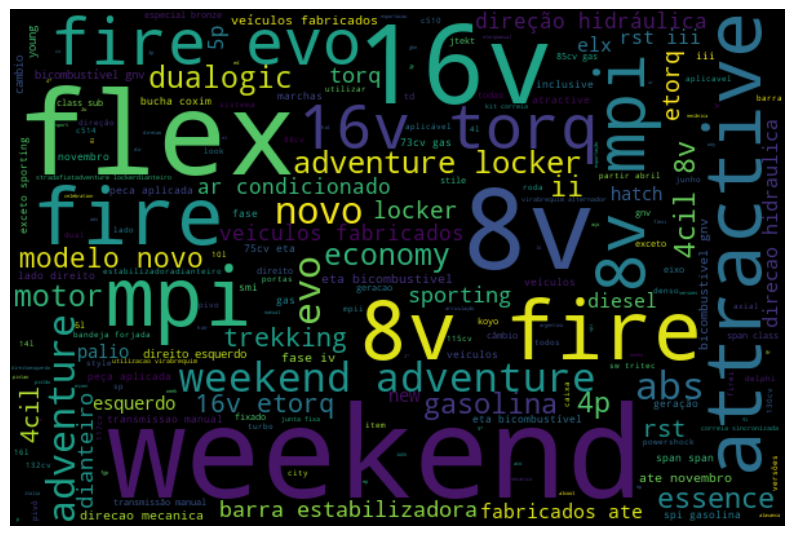

In [42]:
# Word Cloud
df['version'] = df['version'].astype(pd.StringDtype())
df['text_sem_stopwords'] = df['version'].apply(df_pre_processamento)
df['text_sem_stopwords'] = df['text_sem_stopwords'].astype(pd.StringDtype())

#Bigramas
all_words_lem = ' '.join([word for word in df['text_sem_stopwords']])
wordcloud = WordCloud(width=600, 
                height=400, 
                random_state=2, 
                max_font_size=100).generate(all_words_lem)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off');

In [43]:
#Frequencia das palavras
token = nltk.word_tokenize(all_words_lem)
freq_termos_tokens = FreqDist(token)
freq_termos_tokens.most_common(20)

[('1', 303),
 ('8v', 170),
 ('weekend', 136),
 ('16v', 118),
 ('fire', 103),
 ('flex', 94),
 ('4', 78),
 ('0', 67),
 ('10', 67),
 ('mpi', 67),
 ('6', 64),
 ('8', 63),
 ('adventure', 62),
 ('evo', 46),
 ('attractive', 37),
 ('16', 37),
 ('novo', 34),
 ('torq', 32),
 ('locker', 29),
 ('14', 27)]

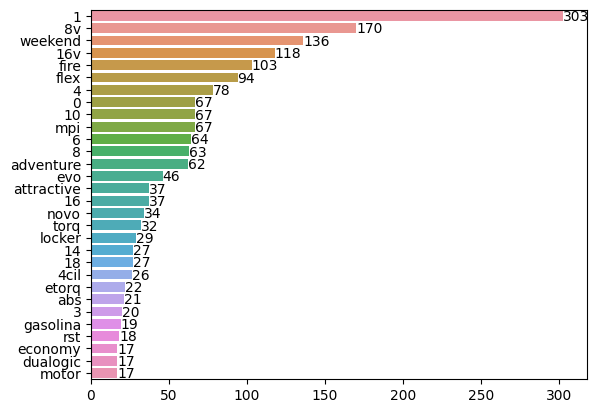

In [44]:
top_termos = freq_termos_tokens.most_common(30)
fdist = pd.Series(dict(top_termos))
sns.barplot(y=fdist.index, x=fdist.values)
for i, v in enumerate(fdist.values):
    plt.text(v + 0, i +0.4, str(v), color='black', fontweight='normal');

Na base de modelos 2012; encontramos mais informações sobre versões da Palio Fire, do que Weekend e Adventure. Encontramos também, mais sobre tipo de combustivel Flex do que gasolina; e mais sobre motores 8v, do que motores de 16v.